# A data set for studying the senses in Jane Eyre

## 1. Obtaining the pattern matches

### 1.a. Importing SpaCy and a spaCy library

We will be using the spaCy natural language processing library. To use this library, you must first install it to your virtual environment. Run `pip install spacy` or similar, depending on the environment manager you are using.

We will begin by using spaCy's small English language model, which is useful and lightweight. To install this you should first run `python -m spacy download en_core_web_sm`. If working with the uv environment manager, you may first need to run `uv pip install pip`.

We can now import the spaCy library and load the English language model, which we store as a variable called `nlp`.

In [1]:
import spacy

In [2]:
nlp = spacy.load('en_core_web_sm')

Other imports that will be required in this notebook, which will require package installations, are 

- `pandas`
- `matplotlib`
- `plotly`
- `wordcloud`
- `seaborn`

Later, we will also need the medium or large English models (`en_core_web_md` or `en_core_web_lg`). There will also be imports from the Python standard library.

### 1.b. Reading the text file

The first step in creating a data set from *Jane Eyre* is to open the text file and read it into memory using Python. The file was obtained from [Project Gutenberg](https://www.gutenberg.org/ebooks/1260). Note that I store the text as a variable called `text`. When I inspect its length, I get a result of a bit over one million characters.

In [3]:
with open('jane-eyre.txt', encoding='utf-8') as je:
    text = je.read()

print(len(text))

1041691


### 1.c. Splitting the text file

By default, spaCy cannot analyze a text over one million characters. Further, it is useful sometimes to analyze shorter segments of text as a way to study how an author develops themes over the course of a novel. To this end, I split the text into its chapters.

To do this, I looked closely at the Project Gutenberg text file. I observed that each chapter was marked by a heading that begain "CHAPTER" in capital letters, followed by a Roman numeral indicating the chapter number. These chapter headings were always surrounded by newline characters. This sequence of characters occurred only where there was a chapter split. Knowing this, I knew it was possible to convert the pattern into a **regular expression** to find the locations of the chapter begnnings and ends.

I decided to use the Python data structure called a **dictionary** to hold the raw text of each chapter. A dictionary holds data in key-value pairs, where the key is how you name and retrieve the value. I decided the keys would be the chapter numbers, but in Arab numerals for ease of referral and retrieval, while the values would be the text of the corresponding chapter. 

Once I understood what I wanted to do, I asked ChatGPT to generate the code for me. It created a function to convert Roman to Arabic numbers, and a separate function to extract the chapters from the full text of the novel. When the `extract_all_chapters` function runs, it stores the chapters dictionary in a variable called `chapters_dict`. To confirm that ir worked, it displays the first 300 characters of chapter 24.

In [4]:
import re

# Helper to convert Roman numerals to Arabic numerals
def roman_to_arabic(roman):
    roman_map = {'I': 1, 'V': 5, 'X': 10, 'L': 50, 'C': 100}
    result = 0
    prev_value = 0
    for char in reversed(roman):
        value = roman_map[char]
        if value < prev_value:
            result -= value
        else:
            result += value
        prev_value = value
    return result

def extract_all_chapters(full_text):
    # Regex pattern to find chapter headers like: \nCHAPTER XXIV\n
    pattern = r"\n+CHAPTER ([IVXLCDM]+)\n+"
    
    matches = list(re.finditer(pattern, full_text, flags=re.IGNORECASE))
    chapters = {}

    for i, match in enumerate(matches):
        roman_num = match.group(1).upper()
        arabic_num = roman_to_arabic(roman_num)

        start_index = match.end()
        end_index = matches[i + 1].start() if i + 1 < len(matches) else len(full_text)

        chapter_text = full_text[start_index:end_index].strip()
        chapters[arabic_num] = chapter_text

    return chapters

# Example usage:
chapters_dict = extract_all_chapters(text)
print(chapters_dict[24][:300])  # print first 300 characters of Chapter 24


As I rose and dressed, I thought over what had happened, and wondered
if it were a dream. I could not be certain of the reality till I had
seen Mr. Rochester again, and heard him renew his words of love and
promise.

While arranging my hair, I looked at my face in the glass, and felt it
was no longe


I then verify that the keys were as expected, the numbers from 1 to 37.

In [5]:
print(chapters_dict.keys())

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37])


We now have the text of the Jane Eyre loaded into memory, split into chapters, and stored in a dictionary where each chapter can be retrieved by its number.

### 1.d. Creating the patterns

Now I am goind to search for mentions of the 5 senses in the text of Jane Eyre. We can find any text pattern using regular expressions. However, spaCy has a built-in equivalent called `Matcher`. The spaCy Matcher component operates not on raw text but on spaCy tokens. This allows it to find matches based not only on the actual text content, but also, for example, on the *lemma* of a word. That is what we will do here. 

We want to find not only mentions of "look" but also "look", "looked", "looks", and all other variants. We can do so by searching for the *lemma* "look". SpaCy has a built in model of the English language grammar and will find all variants of the base dictionary term.

First, we import the Matcher component, then we create a specific instance of it using our current language model vocabulary.

In [6]:
from spacy.matcher import Matcher
matcher = Matcher(nlp.vocab)

I then asked ChatGPT to generate pattern lists for the five senses, with an emphasis on 19th century literary language. Here is the list of patterns aimed at the sense of sight.

In [7]:
sight_patterns = [
    [{"lemma": "see"}],
    [{"lemma": "look"}],
    [{"lemma": "glance"}],
    [{"lemma": "gaze"}],
    [{"lemma": "eye"}],
    [{"lemma": "watch"}],
    [{"lemma": "stare"}],
    [{"lemma": "peep"}],
    [{"lemma": "behold"}],
    [{"lemma": "view"}],
    [{"lemma": "observe"}],
    [{"lemma": "perceive"}],
    [{"lemma": "discern"}],
    [{"lemma": "regard"}],
    [{"lemma": "scan"}],
    [{"lemma": "survey"}],
    [{"lemma": "note"}],
    [{"lemma": "glimpse"}],
    [{"lemma": "witness"}],
    [{"lemma": "spot"}],
    [{"lemma": "recognize"}],
    [{"lemma": "detect"}],
    [{"lemma": "inspect"}],
    [{"lemma": "examine"}],
    [{"lemma": "contemplate"}],
    [{"lemma": "notice"}],
    [{"lemma": "peer"}],
    [{"lemma": "glower"}],   
    [{"lemma": "ogle"}],    
    [{"lemma": "scan"}],
]

Our next step is to add the pattern list to our Matcher instance.

In [8]:
matcher.add("SIGHT", sight_patterns)

We will now test our pattern matcher on one chapter, to make sure everything works correctly before going any further. Here, I am taking one chapter, *tokenizing* it, and running it through the spaCy natural language pipeline. Tokenization extracts the smallest meaningful units of language, which are often words, but sometimes parts of words, or punctuation. SpaCy converts these units into objects that it then runs through its language pipeline. This includes tagging each token with its part-of-speech identification, its syntactic dependencies, and whether or not it is recoginized as a named entity, such as a person or place, and if so what entity. All this happens when we pass a piece of text to the `nlp` function and store the result as a `doc` object.

In [9]:
doc = nlp(chapters_dict[1])

We are now going to pass the spaCy `doc` object to the matcher we previously created, which contains one pattern, called "SIGHT". This will generate a list of matches. Each match contains three pieces of information: a unique ID, its start position within the document (location of its first character), and the end position in the document (location of its last character).

We then loop over all the matches. We find the sentence that the match is in, get the pattern that matched, and add these to a dictionary called `matching_sentences`.

In [11]:
matches = matcher(doc)
matching_sentences = {}
for match_id, start, end in matches:
    sentence = doc[start].sent
    label = nlp.vocab.strings[match_id]
    if sentence not in matching_sentences:
        matching_sentences[sentence] = {"SIGHT": False}
    matching_sentences[sentence][label] = True

When we loop over the results, we see all the sentences in which spaCy found a match for one of our sight patterns. Note that it finds all the grammatical variants of the base lemma. For example, we created a pattern for "see" and it was able to find "saw".

In [12]:
for sentence, sense in matching_sentences.items():
    if sense["SIGHT"]:
        print(sentence)
        print('----------------------')

The said Eliza, John, and Georgiana were now clustered round their mama
in the drawing-room: she lay reclined on a sofa by the fireside, and
with her darlings about her (for the time neither quarrelling nor
crying) looked perfectly happy.
----------------------
Folds of scarlet drapery shut in my view to the right hand; to the left
were the clear panes of glass, protecting, but not separating me from
the drear November day.
----------------------
The words in these
introductory pages connected themselves with the succeeding vignettes,
and gave significance to the rock standing up alone in a sea of billow
and spray; to the broken boat stranded on a desolate coast; to the cold
and ghastly moon glancing through bars of cloud at a wreck just
sinking.


----------------------
So was the black horned thing seated aloof on a rock, surveying a
distant crowd surrounding a gallows.


----------------------
He gorged himself habitually at table, which
made him bilious, and gave him a dim and blea

Now that we know this will work, we can generate more pattern lists. I asked ChatGPT to generate patterns for all five senses.

In [13]:
hearing_patterns = [
    [{"lemma": "hear"}],
    [{"lemma": "listen"}],
    [{"lemma": "overhear"}],
    [{"lemma": "eavesdrop"}],
    [{"lemma": "perceive"}, {"lower": "sound"}], 
    [{"lemma": "attend"}, {"lower": "to"}],      
    [{"lemma": "catch"}, {"lower": "sound"}],
    [{"lemma": "notice"}, {"lower": "sound"}],
    [{"lemma": "detect"}, {"lower": "sound"}],
    
    [{"lemma": "sound"}],
    [{"lemma": "noise"}],
    [{"lemma": "voice"}],
    [{"lemma": "whisper"}],
    [{"lemma": "murmur"}],
    [{"lemma": "shout"}],
    [{"lemma": "cry"}],
    [{"lemma": "call"}],
    [{"lemma": "speak"}],
    [{"lemma": "utter"}],
    [{"lemma": "declare"}],
    [{"lemma": "remark"}],
    [{"lemma": "say"}],
    [{"lemma": "announce"}],
    [{"lemma": "exclaim"}],
    [{"lemma": "sigh"}],
    [{"lemma": "moan"}],
    [{"lemma": "groan"}],
    [{"lemma": "shriek"}],
    [{"lemma": "yell"}],
    [{"lemma": "scream"}],
    [{"lemma": "hiss"}],
    [{"lemma": "howl"}],
    [{"lemma": "echo"}],
]

In [14]:
sound_noun_patterns = [
    [{"lemma": "sound"}],
    [{"lemma": "noise"}],
    [{"lemma": "voice"}],
    [{"lemma": "whisper"}],
    [{"lemma": "murmur"}],
    [{"lemma": "cry"}],
    [{"lemma": "shout"}],
    [{"lemma": "call"}],
    [{"lemma": "sigh"}],
    [{"lemma": "moan"}],
    [{"lemma": "groan"}],
    [{"lemma": "shriek"}],
    [{"lemma": "yell"}],
    [{"lemma": "scream"}],
    [{"lemma": "hiss"}],
    [{"lemma": "howl"}],
    [{"lemma": "echo"}],
    [{"lemma": "tone"}],
    [{"lemma": "utterance"}],
    [{"lemma": "breath"}],      # often used poetically
    [{"lemma": "speech"}],
    [{"lemma": "dialogue"}],
    [{"lemma": "statement"}],
    [{"lemma": "announcement"}],
    [{"lemma": "rumble"}],
    [{"lemma": "roar"}],
    [{"lemma": "clang"}],
    [{"lemma": "rattle"}],
    [{"lemma": "buzz"}],
    [{"lemma": "hum"}],
    [{"lemma": "din"}],         # literary word for a loud, confusing noise
    [{"lemma": "clatter"}],
    [{"lemma": "bang"}],
    [{"lemma": "blast"}],
    [{"lemma": "chime"}],
    [{"lemma": "toll"}],        # as in "the tolling of the bell"
    [{"lemma": "note"}],        # musical or tonal
    [{"lemma": "melody"}],
    [{"lemma": "tune"}],
    [{"lemma": "strain"}],      # archaic word for a passage of music
    [{"lemma": "discord"}],
]


In [15]:
touch_noun_patterns = [
    [{"lemma": "touch"}],
    [{"lemma": "feel"}],
    [{"lemma": "sensation"}],
    [{"lemma": "contact"}],
    [{"lemma": "pressure"}],
    [{"lemma": "grip"}],
    [{"lemma": "grasp"}],
    [{"lemma": "hold"}],
    [{"lemma": "caress"}],
    [{"lemma": "stroke"}],
    [{"lemma": "embrace"}],
    [{"lemma": "clutch"}],
    [{"lemma": "hug"}],
    [{"lemma": "tap"}],
    [{"lemma": "pat"}],
    [{"lemma": "nudge"}],
    [{"lemma": "brush"}],
    [{"lemma": "press"}],
    [{"lemma": "shiver"}],
    [{"lemma": "tingle"}],
    [{"lemma": "warmth"}],
    [{"lemma": "cold"}],
    [{"lemma": "chill"}],
    [{"lemma": "firmness"}],
    [{"lemma": "softness"}],
    [{"lemma": "roughness"}],
    [{"lemma": "smoothness"}],
    [{"lemma": "texture"}],
]


In [16]:
smell_noun_patterns = [
    [{"lemma": "smell"}],
    [{"lemma": "scent"}],
    [{"lemma": "odor"}],
    [{"lemma": "fragrance"}],
    [{"lemma": "perfume"}],
    [{"lemma": "aroma"}],
    [{"lemma": "stench"}],
    [{"lemma": "reek"}],
    [{"lemma": "whiff"}],
    [{"lemma": "fume"}],
    [{"lemma": "essence"}],
    [{"lemma": "breath"}],      # often used poetically for faint smells
    [{"lemma": "bouquet"}],     # old-fashioned word for a blend of scents
    [{"lemma": "incense"}],
    [{"lemma": "musk"}],
    [{"lemma": "vapour"}],
]


In [17]:
taste_noun_patterns = [
    [{"lemma": "taste"}],
    [{"lemma": "flavor"}],
    [{"lemma": "savor"}],
    [{"lemma": "zest"}],
    [{"lemma": "bitterness"}],
    [{"lemma": "sweetness"}],
    [{"lemma": "saltiness"}],
    [{"lemma": "sourness"}],
    [{"lemma": "spice"}],
    [{"lemma": "aftertaste"}],
    [{"lemma": "palate"}],
    [{"lemma": "tang"}],
    [{"lemma": "pungency"}],
    [{"lemma": "delicacy"}],     # as in rare/tasteful food
    [{"lemma": "richness"}],
    [{"lemma": "piquancy"}],
    [{"lemma": "acidity"}],
    [{"lemma": "sharpness"}],
]


In [18]:
touch_verb_patterns = [
    [{"lemma": "touch"}],
    [{"lemma": "feel"}],
    [{"lemma": "grasp"}],
    [{"lemma": "grip"}],
    [{"lemma": "hold"}],
    [{"lemma": "clutch"}],
    [{"lemma": "caress"}],
    [{"lemma": "stroke"}],
    [{"lemma": "embrace"}],
    [{"lemma": "press"}],
    [{"lemma": "pat"}],
    [{"lemma": "tap"}],
    [{"lemma": "brush"}],
    [{"lemma": "nudge"}],
    [{"lemma": "tap"}],
    [{"lemma": "handle"}],
    [{"lemma": "clasp"}],
    [{"lemma": "shiver"}],
    [{"lemma": "tremble"}],
    [{"lemma": "tingle"}],
    [{"lemma": "rub"}],
    [{"lemma": "grate"}],
    [{"lemma": "caress"}],
    [{"lemma": "stroke"}],
]


In [19]:
smell_verb_patterns = [
    [{"lemma": "smell"}],
    [{"lemma": "sniff"}],
    [{"lemma": "inhale"}],
    [{"lemma": "breathe"}],
    [{"lemma": "reek"}],
    [{"lemma": "waft"}],       # can be used for smells moving through air
    [{"lemma": "emit"}],       # e.g., "the flower emitted a scent"
    [{"lemma": "exude"}],
    [{"lemma": "permeate"}],
    [{"lemma": "linger"}],     # used with smells a lot
    [{"lemma": "scent"}],      # can be both verb and noun
    [{"lemma": "detect"}],     # detect a smell
]


In [20]:
taste_verb_patterns = [
    [{"lemma": "taste"}],
    [{"lemma": "savor"}],
    [{"lemma": "lick"}],
    [{"lemma": "chew"}],
    [{"lemma": "swallow"}],
    [{"lemma": "bite"}],
    [{"lemma": "nibble"}],
    [{"lemma": "devour"}],
    [{"lemma": "feast"}],
    [{"lemma": "sample"}],
    [{"lemma": "consume"}],
    [{"lemma": "ingest"}],
    [{"lemma": "relish"}],
    [{"lemma": "gulp"}],
    [{"lemma": "spit"}],
    [{"lemma": "sip"}],
    [{"lemma": "gorge"}],
]


In [21]:
sight_noun_patterns = [
    [{"lemma": "sight"}],
    [{"lemma": "vision"}],
    [{"lemma": "view"}],
    [{"lemma": "scene"}],
    [{"lemma": "appearance"}],
    [{"lemma": "glimpse"}],
    [{"lemma": "look"}],
    [{"lemma": "gaze"}],
    [{"lemma": "glance"}],
    [{"lemma": "stare"}],
    [{"lemma": "watch"}],
    [{"lemma": "observation"}],
    [{"lemma": "eye"}],
    [{"lemma": "spectacle"}],
    [{"lemma": "shape"}],
    [{"lemma": "form"}],
    [{"lemma": "figure"}],
    [{"lemma": "image"}],
    [{"lemma": "vision"}],
    [{"lemma": "light"}],
    [{"lemma": "shadow"}],
    [{"lemma": "outline"}],
    [{"lemma": "aspect"}],
    [{"lemma": "vista"}],
    [{"lemma": "prospect"}],   # often used for landscape views
    [{"lemma": "appearance"}],
]

One problem I can see immediately is that the patterns for the sense of hearing will be overwhelmed by the presence of dialog indicators such as "speak" and "say". These patterns should be eliminated in favor of words that connote listening rather than speaking. Here, I redefine these pattern lists with a bit of manual fine-tuning.

In [22]:
hearing_patterns = [
    [{"lemma": "hear"}],
    [{"lemma": "listen"}],
    [{"lemma": "overhear"}],
    [{"lemma": "eavesdrop"}],
    [{"lemma": "perceive"}, {"lower": "sound"}], 
    [{"lemma": "attend"}, {"lower": "to"}],      
    [{"lemma": "catch"}, {"lower": "sound"}],
    [{"lemma": "notice"}, {"lower": "sound"}],
    [{"lemma": "detect"}, {"lower": "sound"}],
    
    [{"lemma": "sound"}],
    [{"lemma": "noise"}],
    [{"lemma": "voice"}],
    [{"lemma": "whisper"}],
    [{"lemma": "murmur"}],
    [{"lemma": "sigh"}],
    [{"lemma": "moan"}],
    [{"lemma": "groan"}],
    [{"lemma": "shriek"}],
    [{"lemma": "yell"}],
    [{"lemma": "scream"}],
    [{"lemma": "hiss"}],
    [{"lemma": "howl"}],
    [{"lemma": "echo"}],
]

sound_noun_patterns = [
    [{"lemma": "sound"}],
    [{"lemma": "noise"}],
    [{"lemma": "voice"}],
    [{"lemma": "whisper"}],
    [{"lemma": "murmur"}],
    [{"lemma": "sigh"}],
    [{"lemma": "moan"}],
    [{"lemma": "groan"}],
    [{"lemma": "shriek"}],
    [{"lemma": "hiss"}],
    [{"lemma": "howl"}],
    [{"lemma": "echo"}],
    [{"lemma": "tone"}],
    [{"lemma": "utterance"}],
    [{"lemma": "breath"}],      # often used poetically
    [{"lemma": "speech"}],
    [{"lemma": "dialogue"}],
    [{"lemma": "statement"}],
    [{"lemma": "announcement"}],
    [{"lemma": "rumble"}],
    [{"lemma": "roar"}],
    [{"lemma": "clang"}],
    [{"lemma": "rattle"}],
    [{"lemma": "buzz"}],
    [{"lemma": "hum"}],
    [{"lemma": "din"}],         # literary word for a loud, confusing noise
    [{"lemma": "clatter"}],
    [{"lemma": "bang"}],
    [{"lemma": "blast"}],
    [{"lemma": "chime"}],
    [{"lemma": "toll"}],        # as in "the tolling of the bell"
    [{"lemma": "note"}],        # musical or tonal
    [{"lemma": "melody"}],
    [{"lemma": "tune"}],
    [{"lemma": "strain"}],      # archaic word for a passage of music
    [{"lemma": "discord"}],
]

## 2. Creating Data Frames

### 2.a. Creating a data frame for two senses in one chapter

To interact with our data, we are going to convert it into tabular form. We will use the `pandas` library for this.

In [24]:
import pandas as pd

We will now add the hearing patterns to our matcher, as well as the new list of sight nouns. We do not need to add our first sight pattern list because it is already in our matcher.

In [25]:
matcher.add("SOUND", hearing_patterns)
matcher.add("SOUND", sound_noun_patterns)

In [28]:
matcher.add("SIGHT", sight_noun_patterns)

It is often helpful to try things out on smaller sets of data before running the full algorithm on the full set of data. Here we are going to create a table with just the sound and sight patterns, and just for chapter 1. Recall that we have chapter 1 tokenized and saved as a spaCy doc, in a variable called `doc`. Here we are going to get the matches, then loop over the matches. We are going to extract a spaCy `span` object for the match and find the sentence it's in. We're going to get the sense pattern that it matched. We'll clean the sentence of whitespace and newline characters and we'll add all this information to a dictionary. Then we will generate a Pandas dataframe (table) from the dictionary.

In [29]:
match_data = []
chapter_number = 1
matches = matcher(doc)
for match_id, start, end in matches:
    span = doc[start:end]
    sentence = span.sent
    label = nlp.vocab.strings[match_id]  # e.g., "SIGHT"
    lemma = span[0].lemma_               # take first token’s lemma as representative

    cleaned_sentence = " ".join(sentence.text.strip().split())
    
    match_data.append({
        "chapter": chapter_number,
        "sense": label,
        "lemma": lemma,
        "sentence": cleaned_sentence,
        "sentence_start_char": sentence.start_char,
        "sentence_end_char": sentence.end_char
    })

df = pd.DataFrame(match_data)

We can now inspect the dataframe that we created. It should contain the chapter number, the sense that was found, the specific term that was matched, the sentence the term was in, and the start and end points for the sentence.

In [30]:
df

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,SIGHT,look,"The said Eliza, John, and Georgiana were now c...",667,905
1,1,SOUND,hear,"Me, she had dispensed from joining the group; ...",906,1395
2,1,SIGHT,observation,"Me, she had dispensed from joining the group; ...",906,1395
3,1,SIGHT,light,"Me, she had dispensed from joining the group; ...",906,1395
4,1,SIGHT,view,Folds of scarlet drapery shut in my view to th...,2015,2180
5,1,SIGHT,aspect,"At intervals, while turning over the leaves of...",2181,2283
6,1,SIGHT,scene,"Afar, it offered a pale blank of mist and clou...",2284,2458
7,1,SOUND,blast,"Afar, it offered a pale blank of mist and clou...",2284,2458
8,1,SIGHT,form,Of these death-white realms I formed an idea o...,3511,3682
9,1,SIGHT,glance,The words in these introductory pages connecte...,3683,3990


### 2.b. Extracting sense-references from the full text of Jane Eyre

Since we may want to extract sense matches from different parts of the text, and for different sense matches, at different times, we will create a function that extracts matches. This function was generated with assistance from ChatGPT based on my instructions. Note that I have set it up to work with a dictionary of chapters, which is how we are storing our text data. This function will loop over a dictionary of texts, extract the text, run the pattern match on the text, extract all the desired information, and add it to a list called `match_data`, before generating a data frame from all the data.

In [32]:
def extract_sensory_matches(chapters_dict, matcher, nlp):
    match_data = []

    for chapter_number, chapter_text in chapters_dict.items():
        doc = nlp(chapter_text)
        matches = matcher(doc)

        for match_id, start, end in matches:
            span = doc[start:end]
            sentence = span.sent
            label = nlp.vocab.strings[match_id]
            lemma = span[0].lemma_
            cleaned_sentence = " ".join(sentence.text.strip().split())

            match_data.append({
                "chapter": chapter_number,
                "sense": label,
                "lemma": lemma,
                "sentence": cleaned_sentence,
                "sentence_start_char": sentence.start_char,
                "sentence_end_char": sentence.end_char,
            })

    return pd.DataFrame(match_data)


Here, we are running the function on our dictionary of Jane Eyre chapters. The `.head()` method will show the first five rows of our data frame by default. Note that this function will take some time to run, as each chapter must be tokenized and analyzed in turn.

In [33]:
df = extract_sensory_matches(chapters_dict, matcher, nlp)
df.head()

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,SIGHT,look,"The said Eliza, John, and Georgiana were now c...",667,905
1,1,SOUND,hear,"Me, she had dispensed from joining the group; ...",906,1395
2,1,SIGHT,observation,"Me, she had dispensed from joining the group; ...",906,1395
3,1,SIGHT,light,"Me, she had dispensed from joining the group; ...",906,1395
4,1,SIGHT,view,Folds of scarlet drapery shut in my view to th...,2015,2180


If we want to see the complete sentence, we need to modify the pandas library default setting that limits the amount of information displayed for each column. We can also decide to see more rows than the default when we run the `.head()` method.

In [34]:
pd.set_option('display.max_colwidth', None)
df.head(10)

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,SIGHT,look,"The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy.",667,905
1,1,SOUND,hear,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
2,1,SIGHT,observation,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
3,1,SIGHT,light,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
4,1,SIGHT,view,"Folds of scarlet drapery shut in my view to the right hand; to the left were the clear panes of glass, protecting, but not separating me from the drear November day.",2015,2180
5,1,SIGHT,aspect,"At intervals, while turning over the leaves of my book, I studied the aspect of that winter afternoon.",2181,2283
6,1,SIGHT,scene,"Afar, it offered a pale blank of mist and cloud; near a scene of wet lawn and storm-beat shrub, with ceaseless rain sweeping away wildly before a long and lamentable blast.",2284,2458
7,1,SOUND,blast,"Afar, it offered a pale blank of mist and cloud; near a scene of wet lawn and storm-beat shrub, with ceaseless rain sweeping away wildly before a long and lamentable blast.",2284,2458
8,1,SIGHT,form,"Of these death-white realms I formed an idea of my own: shadowy, like all the half-comprehended notions that float dim through children’s brains, but strangely impressive.",3511,3682
9,1,SIGHT,glance,"The words in these introductory pages connected themselves with the succeeding vignettes, and gave significance to the rock standing up alone in a sea of billow and spray; to the broken boat stranded on a desolate coast; to the cold and ghastly moon glancing through bars of cloud at a wreck just sinking.",3683,3990


The `.info()` method provides us with the number of rows and the column data types.

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3249 entries, 0 to 3248
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   chapter              3249 non-null   int64 
 1   sense                3249 non-null   object
 2   lemma                3249 non-null   object
 3   sentence             3249 non-null   object
 4   sentence_start_char  3249 non-null   int64 
 5   sentence_end_char    3249 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 152.4+ KB


If I look at the end of the dataset, I can see that the last chapter includes the Project Gutenberg license, which is not actually part of the text of Jane Eyre.

In [39]:
df.tail()

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
3244,37,SIGHT,see,"To learn more about the Project Gutenberg Literary Archive Foundation and how your efforts and donations can help, see Sections 3 and 4 and the Foundation information page at www.gutenberg.org.",64871,65066
3245,37,SIGHT,form,Information about Donations to the Project Gutenberg Literary Archive Foundation Project Gutenberg™ depends upon and cannot survive without widespread public support and donations to carry out its mission of increasing the number of public domain and licensed works that can be freely distributed in machine-readable form accessible by the widest array of equipment including outdated equipment.,65860,66256
3246,37,SOUND,statement,"International donations are gratefully accepted, but we cannot make any statements concerning tax treatment of donations received from outside the United States.",67123,67284
3247,37,SIGHT,notice,"Project Gutenberg™ eBooks are often created from several printed editions, all of which are confirmed as not protected by copyright in the U.S. unless a copyright notice is included.",67923,68105
3248,37,SOUND,hear,"This website includes information about Project Gutenberg™, including how to make donations to the Project Gutenberg Literary Archive Foundation, how to help produce our new eBooks, and how to subscribe to our email newsletter to hear about new eBooks.",68288,68540


We don't want to have the Project Gutenberg license counted towards our data on references to the five senses in Jane Eyre. To remedy this issue, I worked with ChatGPT to develop a function for removing the license information. This took a few iterations to get right.

In [44]:
import re

def strip_license_from_last_chapter(chapters_dict: dict) -> dict:
    if not chapters_dict:
        return chapters_dict

    license_patterns = [
        r"\*\*\* (START|END) OF (THE )?PROJECT GUTENBERG.*?\*\*\*",  # Common start/end markers
        r"License:.*",  # License marker you used
        r"Information about.*Project Gutenberg",  # A soft catch-all
    ]

    last_key = list(chapters_dict.keys())[-1]
    last_text = chapters_dict[last_key]

    for pattern in license_patterns:
        match = re.search(pattern, last_text, re.IGNORECASE | re.DOTALL)
        if match:
            chapters_dict[last_key] = last_text[:match.start()].strip()
            break

    return chapters_dict

I run the function to strip the license text from the last chapter, then re-run the function to extract the sense matches, and redefine the data frame variable `df` to hold the new information.

In [45]:
chapters_dict = strip_license_from_last_chapter(chapters_dict)
df = extract_sensory_matches(chapters_dict, matcher, nlp)
df.tail()

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
3230,37,SIGHT,see,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
3231,37,SIGHT,eye,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
3232,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859
3233,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859
3234,37,SIGHT,eye,"The last letter I received from him drew from my eyes human tears, and yet filled my heart with divine joy: he anticipated his sure reward, his incorruptible crown.",49349,49513


We can see that the process worked, and we now have only the matches that pertain to the actual text of Jane Eyre. So far we have 3234 matches pertaining to the senses of sight and sound. These are likely the predominant senses in Jane Eyre, but to verify this we can extract references for the remaining senses.

### 2.c. Extracting references for smell, taste, and touch

First we will add the patterns for the sense of smell to our matcher. Recall that these patterns are AI generated, and may be improved or modified by human fine-tuning.

In [46]:
matcher.add("SMELL", smell_noun_patterns)
matcher.add("SMELL", smell_verb_patterns)

It may be helpful to be able to generate a data frame consisting of matches for only one sense at a time, so I work with ChatGPT to generate a function for this purpose.

In [47]:
def extract_single_sense(chapters_dict, matcher, nlp, sense: str) -> pd.DataFrame:
    all_matches = extract_sensory_matches(chapters_dict, matcher, nlp)
    return all_matches[all_matches["sense"] == sense].reset_index(drop=True)

Now I can run this function to generate a data frame of references to the sense of smell in Jane Eyre:

In [48]:
df_smell = extract_single_sense(chapters_dict, matcher, nlp, "SMELL")
df_smell

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,2,SMELL,breathe,"Mr. Reed had been dead nine years: it was in this chamber he breathed his last; here he lay in state; hence his coffin was borne by the undertaker’s men; and, since that day, a sense of dreary consecration had guarded it from frequent intrusion.",5123,5370
1,4,SMELL,breath,"“What?” said Mrs. Reed under her breath: her usually cold composed grey eye became troubled with a look like fear; she took her hand from my arm, and gazed at me as if she really did not know whether I were child or fiend.",2738,2960
2,4,SMELL,breathe,"Having spread the quilt and folded my night-dress, I went to the window-seat to put in order some picture-books and doll’s house furniture scattered there; an abrupt command from Georgiana to let her playthings alone (for the tiny chairs and mirrors, the fairy plates and cups, were her property) stopped my proceedings; and then, for lack of other occupation, I fell to breathing on the frost-flowers with which the window was fretted, and thus clearing a space in the glass through which I might look out on the grounds, where all was still and petrified under the influence of a hard frost.",8695,9290
3,5,SMELL,fume,"I saw a universal manifestation of discontent when the fumes of the repast met the nostrils of those destined to swallow it; from the van of the procession, the tall girls of the first class, rose the whispered words— “Disgusting!",11882,12113
4,7,SMELL,breath,"And before I could draw breath, “I must not forget I have a word to say respecting her.”",14447,14535
...,...,...,...,...,...,...
93,34,SMELL,linger,But go after him; he is now lingering in the passage expecting you—he will make it up.”,50031,50120
94,35,SMELL,linger,"All this was torture to me—refined, lingering torture.",1639,1693
95,36,SMELL,breathe,I breathed again: my blood resumed its flow.,12295,12339
96,37,SMELL,breath,"I stayed my step, almost my breath, and stood to watch him—to examine him, myself unseen, and alas!",2970,3069


I have found 97 potential references to smell in Jane Eyre, confirming that it in this novel smell is far less important than sight and sound, at least from a numerical standpoint.

It will be helpful to have one data frame combining data for all senses, as well as data frames for each individual sense. To this end, I work with ChatGPT to develop a function for combining two data frames. This takes a few iterations.

In [49]:
def combine_dataframes(df1, df2):
    combined_df = pd.concat([df1, df2], ignore_index=True)
    combined_df = combined_df.sort_values(by=["chapter", "sentence_start_char"]).reset_index(drop=True)
    return combined_df

We can now create a data frame that will eventually hold data for all senses. For now, it holds data for sight, sound, and smell.

In [51]:
all_senses_df = combine_dataframes(df, df_smell)
all_senses_df

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,SIGHT,look,"The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy.",667,905
1,1,SOUND,hear,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
2,1,SIGHT,observation,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
3,1,SIGHT,light,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
4,1,SIGHT,view,"Folds of scarlet drapery shut in my view to the right hand; to the left were the clear panes of glass, protecting, but not separating me from the drear November day.",2015,2180
...,...,...,...,...,...,...
3328,37,SIGHT,see,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
3329,37,SIGHT,eye,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
3330,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859
3331,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859


Before incorporating taste, it will be helpful to create separate data frames for sight and sound.

In [52]:
df_sight = extract_single_sense(chapters_dict, matcher, nlp, "SIGHT")
df_sight

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,SIGHT,look,"The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy.",667,905
1,1,SIGHT,observation,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
2,1,SIGHT,light,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
3,1,SIGHT,view,"Folds of scarlet drapery shut in my view to the right hand; to the left were the clear panes of glass, protecting, but not separating me from the drear November day.",2015,2180
4,1,SIGHT,aspect,"At intervals, while turning over the leaves of my book, I studied the aspect of that winter afternoon.",2181,2283
...,...,...,...,...,...,...
2352,37,SIGHT,see,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
2353,37,SIGHT,eye,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
2354,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859
2355,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859


In [53]:
df_sound = extract_single_sense(chapters_dict, matcher, nlp, "SOUND")
df_sound

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,SOUND,hear,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
1,1,SOUND,blast,"Afar, it offered a pale blank of mist and cloud; near a scene of wet lawn and storm-beat shrub, with ceaseless rain sweeping away wildly before a long and lamentable blast.",2284,2458
2,1,SOUND,voice,“Boh! Madam Mope!” cried the voice of John Reed; then he paused: he found the room apparently empty.,5287,5389
3,1,SOUND,hear,"There were moments when I was bewildered by the terror he inspired, because I had no appeal whatever against either his menaces or his inflictions; the servants did not like to offend their young master by taking my part against him, and Mrs. Reed was blind and deaf on the subject: she never saw him strike or heard him abuse me, though he did both now and then in her very presence, more frequently, however, behind her back.",7266,7695
4,1,SOUND,hear,"Did you hear her, Eliza and Georgiana?",9879,9917
...,...,...,...,...,...,...
873,37,SOUND,echo,"“You cannot now wonder,” continued my master, “that when you rose upon me so unexpectedly last night, I had difficulty in believing you any other than a mere voice and vision, something that would melt to silence and annihilation, as the midnight whisper and mountain echo had melted before.",39274,39565
874,37,SOUND,note,I put into his hand a five-pound note.,41912,41950
875,37,SOUND,hear,"Without waiting to hear more, I left the kitchen.",41951,42000
876,37,SOUND,sound,"As she grew up, a sound English education corrected in a great measure her French defects; and when she left school, I found in her a pleasing and obliging companion: docile, good-tempered, and well-principled.",44170,44380


Now we can proceed to extract the references to taste and touch.

In [54]:
matcher.add('TASTE', taste_noun_patterns)
matcher.add('TASTE', taste_verb_patterns)
df_taste = extract_single_sense(chapters_dict, matcher, nlp, "TASTE")
df_taste

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,TASTE,gorge,"He gorged himself habitually at table, which made him bilious, and gave him a dim and bleared eye and flabby cheeks.",6431,6548
1,3,TASTE,taste,"Again I reflected: I scarcely knew what school was: Bessie sometimes spoke of it as a place where young ladies sat in the stocks, wore backboards, and were expected to be exceedingly genteel and precise: John Reed hated his school, and abused his master; but John Reed’s tastes were no rule for mine, and if Bessie’s accounts of school-discipline (gathered from the young ladies of a family where she had lived before coming to Gateshead) were somewhat appalling, her details of certain accomplishments attained by these same young ladies were, I thought, equally attractive.",14163,14738
2,4,TASTE,taste,"Something of vengeance I had tasted for the first time; as aromatic wine it seemed, on swallowing, warm and racy: its after-flavour, metallic and corroding, gave me a sensation as if I had been poisoned.",27048,27252
3,5,TASTE,swallow,"I saw a universal manifestation of discontent when the fumes of the repast met the nostrils of those destined to swallow it; from the van of the procession, the tall girls of the first class, rose the whispered words— “Disgusting!",11882,12113
4,5,TASTE,devour,"Ravenous, and now very faint, I devoured a spoonful or two of my portion without thinking of its taste; but the first edge of hunger blunted, I perceived I had got in hand a nauseous mess; burnt porridge is almost as bad as rotten potatoes; famine itself soon sickens over it.",12790,13066
...,...,...,...,...,...,...
95,34,TASTE,consume,"There would be recesses in my mind which would be only mine, to which he never came, and sentiments growing there fresh and sheltered which his austerity could never blight, nor his measured warrior-march trample down: but as his wife—at his side always, and always restrained, and always checked—forced to keep the fire of my nature continually low, to compel it to burn inwardly and never utter a cry, though the imprisoned flame consumed vital after vital—_this_ would be unendurable.",45165,45654
96,36,TASTE,delicacy,"They might have said, as I have no doubt they thought, that they had believed me to be without any friends save them: for, indeed, I had often said so; but, with their true natural delicacy, they abstained from comment, except that Diana asked me if I was sure I was well enough to travel.",3086,3375
97,37,TASTE,sweetness,"No—I have touched you, heard you, felt the comfort of your presence—the sweetness of your consolation: I cannot give up these joys.",12668,12799
98,37,TASTE,taste,"“His manners, I think, you said are not to your taste?—priggish and parsonic?” “I never mentioned his manners; but, unless I had a very bad taste, they must suit it; they are polished, calm, and gentlemanlike.”",25332,25545


We can now combine the data frames for taste and touch into our all-senses data frame.

In [55]:
matcher.add('TOUCH', touch_noun_patterns)
matcher.add('TOUCH', touch_verb_patterns)
df_touch = extract_single_sense(chapters_dict, matcher, nlp, "TOUCH")
df_touch

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,TOUCH,cold,"We had been wandering, indeed, in the leafless shrubbery an hour in the morning; but since dinner (Mrs. Reed, when there was no company, dined early) the cold winter wind had brought with it clouds so sombre, and a rain so penetrating, that further outdoor exercise was now out of the question.",52,348
1,1,TOUCH,cold,"Nor could I pass unnoticed the suggestion of the bleak shores of Lapland, Siberia, Spitzbergen, Nova Zembla, Iceland, Greenland, with “the vast sweep of the Arctic Zone, and those forlorn regions of dreary space,—that reservoir of frost and snow, where firm fields of ice, the accumulation of centuries of winters, glazed in Alpine heights above heights, surround the pole, and concentre the multiplied rigours of extreme cold.”",3082,3510
2,1,TOUCH,cold,"The words in these introductory pages connected themselves with the succeeding vignettes, and gave significance to the rock standing up alone in a sea of billow and spray; to the broken boat stranded on a desolate coast; to the cold and ghastly moon glancing through bars of cloud at a wreck just sinking.",3683,3990
3,1,TOUCH,tremble,"And I came out immediately, for I trembled at the idea of being dragged forth by the said Jack.",5856,5953
4,1,TOUCH,feel,but first—” He ran headlong at me: I felt him grasp my hair and my shoulder: he had closed with a desperate thing.,9937,10052
...,...,...,...,...,...,...
669,37,TOUCH,feel,"Don’t you feel hungry?” “The third day from this must be our wedding-day, Jane.",34545,34625
670,37,TOUCH,feel,"“I was in my own room, and sitting by the window, which was open: it soothed me to feel the balmy night-air; though I could see no stars and only by a vague, luminous haze, knew the presence of a moon.",36660,36861
671,37,TOUCH,hold,"I took that dear hand, held it a moment to my lips, then let it pass round my shoulder: being so much lower of stature than he, I served both for his prop and guide.",40057,40222
672,37,TOUCH,hold,I hold myself supremely blest—blest beyond what language can express; because I am my husband’s life as fully as he is mine.,44829,44953


In [78]:
all_senses_df = combine_dataframes(all_senses_df, df_taste)
all_senses_df = combine_dataframes(all_senses_df, df_touch)
all_senses_df

,chapter,sense,lemma,sentence,sentence_start_char,sentence_end_char
0,1,TOUCH,cold,"We had been wandering, indeed, in the leafless shrubbery an hour in the morning; but since dinner (Mrs. Reed, when there was no company, dined early) the cold winter wind had brought with it clouds so sombre, and a rain so penetrating, that further outdoor exercise was now out of the question.",52,348
1,1,SIGHT,look,"The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy.",667,905
2,1,SOUND,hear,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
3,1,SIGHT,observation,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
4,1,SIGHT,light,"Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”",906,1395
...,...,...,...,...,...,...
4102,37,SIGHT,see,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
4103,37,SIGHT,eye,"When his first-born was put into his arms, he could see that the boy had inherited his own eyes, as they once were—large, brilliant, and black.",47400,47543
4104,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859
4105,37,SIGHT,see,"Diana and Mary Rivers are both married: alternately, once every year, they come to see us, and we go to see them.",47746,47859


### 2.d. Sentences with multiple sense matches

Finally, it may be interesting to have a dataset covering sentences in which more than one sense reference is present. I work with ChatGPT on a script to generate this data frame.

In [79]:
# First, identify the sentences with more than one unique sense
sense_counts = all_senses_df.groupby('sentence')['sense'].nunique()
multi_sense_sentences = sense_counts[sense_counts > 1].index

# Filter to only those sentences
df_multi_sense = all_senses_df[all_senses_df['sentence'].isin(multi_sense_sentences)]

# Now aggregate the information into one row per sentence
aggregated_df = df_multi_sense.groupby('sentence').agg({
    'chapter': 'first',
    'sense': lambda x: list(x.unique()),
    'lemma': lambda x: list(x),
    'sentence_start_char': 'first',
    'sentence_end_char': 'first'
}).reset_index()

aggregated_df

,sentence,chapter,sense,lemma,sentence_start_char,sentence_end_char
0,"A certain superciliousness of look, coolness of manner, nonchalance of tone, express fully their sentiments on the point, without committing them by any positive rudeness in word or deed.",21,"[SIGHT, SOUND]","[look, tone]",19513,19702
1,"A great moth goes humming by me; it alights on a plant at Mr. Rochester’s foot: he sees it, and bends to examine it.",23,"[SOUND, SIGHT]","[hum, see, examine]",3366,3484
2,"A note was accordingly addressed to that lady, who returned for answer, that “I might do as I pleased: she had long relinquished all interference in my affairs.”",10,"[SIGHT, SOUND]","[note, note]",15797,15958
3,"A soft sound of rising now became audible; the curtain was swept back from the arch; through it appeared the dining-room, with its lit lustre pouring down light on the silver and glass of a magnificent dessert-service covering a long table; a band of ladies stood in the opening; they entered, and the curtain fell behind them.",17,"[SOUND, SIGHT]","[sound, light, light]",20909,21238
4,"A waft of wind came sweeping down the laurel-walk, and trembled through the boughs of the chestnut: it wandered away—away—to an indefinite distance—it died.",23,"[SMELL, TOUCH]","[waft, tremble]",15038,15194
...,...,...,...,...,...,...
475,"“Why, you see, Miss Eyre, it is not a common mishap: his life has been very wild: these last three years he gave himself up to strange ways, and his death was shocking.” “I heard from Bessie he was not doing well.” “Doing well!",21,"[SIGHT, SOUND]","[see, hear]",3192,3421
476,“Yes; it was to see or hear news of a friend about whom I had for some time been uneasy.”,36,"[SIGHT, SOUND]","[see, hear]",2995,3086
477,"“You are too inquisitive, St. John,” murmured Mary in a low voice; but he leaned over the table and required an answer by a second firm and piercing look.",29,"[SOUND, SIGHT]","[murmur, voice, look]",18321,18477
478,"“You cannot now wonder,” continued my master, “that when you rose upon me so unexpectedly last night, I had difficulty in believing you any other than a mere voice and vision, something that would melt to silence and annihilation, as the midnight whisper and mountain echo had melted before.",37,"[SOUND, SIGHT]","[voice, vision, whisper, echo]",39274,39565


## 3. Visualizing the Data

With our data frames ready, our next step is to develop some visualizations that help us understand the data. Here is a stacked bar chart. Code for these visualizations was created with the assistance of ChatGPT.

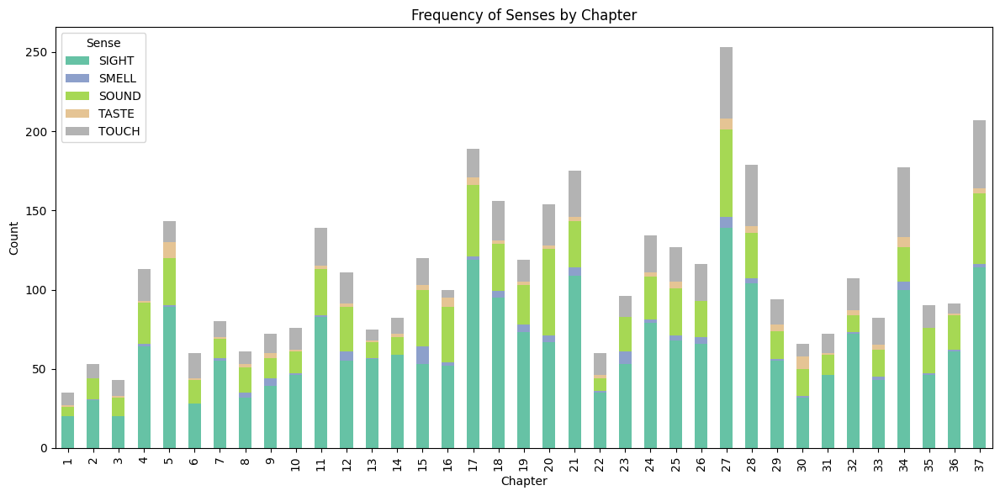

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

# Count occurrences of each sense per chapter
sense_counts = all_senses_df.groupby(['chapter', 'sense']).size().unstack(fill_value=0)

# Plot
sense_counts.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set2')
plt.title('Frequency of Senses by Chapter')
plt.xlabel('Chapter')
plt.ylabel('Count')
plt.legend(title='Sense')
plt.tight_layout()
plt.show()

Here is a heat map:

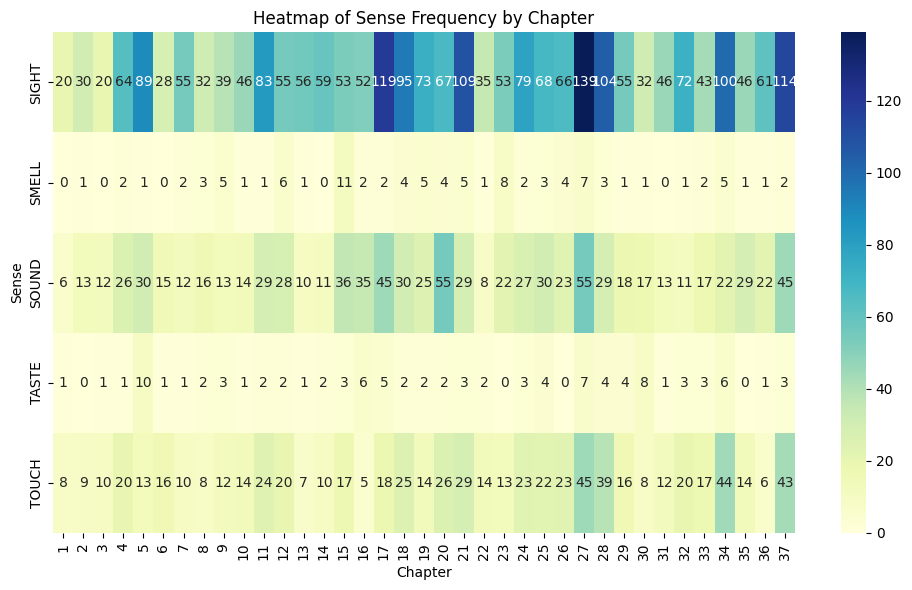

In [81]:
plt.figure(figsize=(10, 6))
sns.heatmap(sense_counts.T, cmap="YlGnBu", annot=True, fmt="d")
plt.title('Heatmap of Sense Frequency by Chapter')
plt.xlabel('Chapter')
plt.ylabel('Sense')
plt.tight_layout()
plt.show()

Here is a line graph:

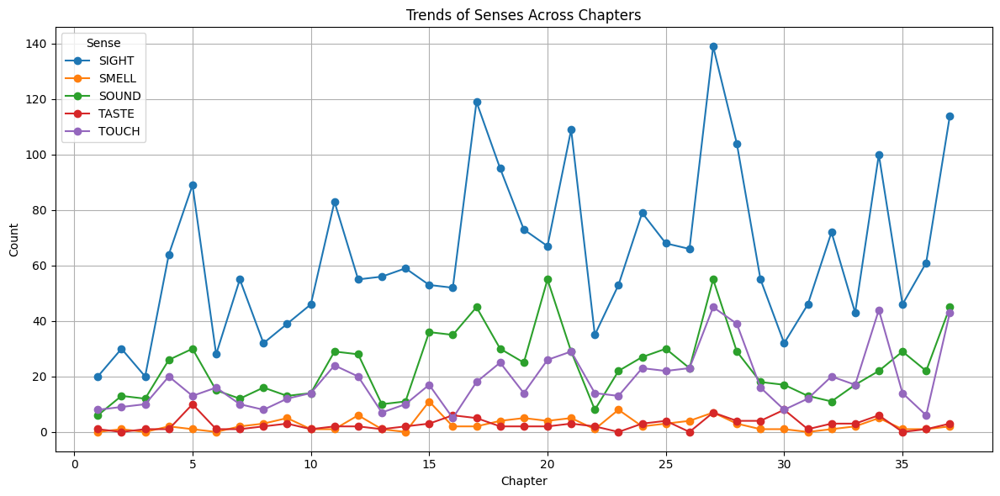

In [83]:
sense_counts.plot(figsize=(12, 6), marker='o')
plt.title('Trends of Senses Across Chapters')
plt.xlabel('Chapter')
plt.ylabel('Count')
plt.legend(title='Sense')
plt.grid(True)
plt.tight_layout()
plt.show()

Here is an interactive scatter plot:

In [84]:
import plotly.express as px

fig = px.scatter(
    all_senses_df,
    x='chapter',
    y='sentence_start_char',
    color='sense',
    hover_data=['lemma', 'sentence'],
    title='Interactive Scatter Plot of Senses Across Chapters',
    labels={'chapter': 'Chapter', 'sentence_start_char': 'Sentence Start Position'},
    opacity=0.7,
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_layout(height=600)
fig.show()

Since the different chapters have different lengths, it might be useful to calculate some sort of relative frequency measure. To this end, I calculate the density of sense references in each chapter, measured by number of sense references per 10000 characters. I then generate an interactive bar chart showing this data.

It may be helpful to have the source data for this visualization stored in its own data frame. I work with ChatGPT to generate a data frame containing the total number of sense references, the chapter length, and the density of references for each chapter.

In [90]:
chapter_lengths = {k: len(v) for k, v in chapters_dict.items()}
sense_counts = all_senses_df.groupby(['chapter', 'sense']).size().reset_index(name='count')
sense_density = sense_counts.merge(length_df, on='chapter')
sense_density['density'] = sense_density['count'] / sense_density['chapter_length'] * 10000

fig = px.bar(
    sense_density,
    x='chapter',
    y='density',
    color='sense',
    title='Density of Sense References (per 10,000 Characters) by Chapter',
    barmode='group',
    labels={'density': 'References per 10,000 Characters'},
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig.update_layout(xaxis=dict(type='category'))
fig.show()

We can visualize this data in a bar graph.

In [91]:
# Sum counts for all senses per chapter
total_sense_counts = all_senses_df.groupby('chapter').size().reset_index(name='total_count')

# Merge with chapter lengths
total_sense_density = total_sense_counts.merge(length_df, on='chapter')

# Calculate density: references per 10,000 characters
total_sense_density['density'] = (total_sense_density['total_count'] / total_sense_density['chapter_length']) * 10000
total_sense_density

,chapter,total_count,chapter_length,density
0,1,35,10839,32.290802
1,2,53,15339,34.552448
2,3,43,17630,24.390244
3,4,113,32013,35.298160
4,5,143,27749,51.533389
5,6,60,16021,37.450846
6,7,80,20115,39.771315
7,8,61,16519,36.927175
8,9,72,17767,40.524568
9,10,76,23967,31.710268


In [94]:
fig = px.bar(
    total_sense_density,
    x='chapter',
    y='density',
    title='Total Sense References Density (per 10,000 Characters) by Chapter',
    labels={'density': 'References per 10,000 Characters'},
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_layout(xaxis=dict(type='category'))
fig.show()


## 4. Love and the senses in Jane Eyre

It will be interesting to now associate sense-references with other themes in Jane Eyre. For example, we could search for connections between sense-references and the evolving relationship between Jane and Rochester. To do this, it will be helpful to change the unit of analysis from the sentence to the paragraph.

### 4.a. Finding paragraphs with references to the senses in one chapter

To start, I work with ChatGPT to create a method for extracting paragraphs from spaCy doc objects. The result of this is not a list of paragraphs, it is a list of `span` objects, which are segments of `doc` objects that are fully tokenized and contain parts of speech tags, syntactic dependency analysis, and named entity recognition.

In [95]:
def get_paragraph_spans(paragraphs, doc):
    paragraph_spans = []
    current_start = 0

    for paragraph in paragraphs:
        # Skip empty paragraphs
        if not paragraph.strip():
            continue
        
        # Find the start and end tokens for this paragraph
        start_token = doc.text.index(paragraph.strip(), current_start)
        start_index = doc.text.count('\n', 0, start_token) // 2
        
        paragraph_tokens = [token for token in doc if token.idx >= start_token and 
                             token.idx < (start_token + len(paragraph))]
        
        if paragraph_tokens:
            # Create a Span from the first to the last token of the paragraph
            span = doc[paragraph_tokens[0].i : paragraph_tokens[-1].i + 1]
            paragraph_spans.append(span)
        
        # Update the current start position
        current_start = start_token + len(paragraph)

    return paragraph_spans

We can also modify this function to find only paragraphs that contain matches to our sense patterns.

In [96]:
def find_paragraphs_with_matches(chapter_text, matcher, nlp):
    paragraphs = chapter_text.split("\n\n")
    doc = nlp(chapter_text)
    paragraph_spans = get_paragraph_spans(paragraphs, doc)
    
    results = []

    for i, span in enumerate(paragraph_spans):
        matches = matcher(span)
        if matches:
            # Get the character offset of the paragraph's start in the full chapter
            char_start = span.start_char
            results.append({
                "paragraph_index": i,
                "char_start": char_start,
                "text": span.text,
                "matches": [(nlp.vocab.strings[match_id], span[start:end].text) 
                            for match_id, start, end in matches]
            })

    return results

To test this, I will run it on the first chapter only and output the first three matches.

In [100]:
ch1_sense_matches = find_paragraphs_with_matches(chapters_dict[1], matcher, nlp)
print(len(ch1_sense_matches))

17


In [101]:
ch1_sense_matches[:3]

[{'paragraph_index': 0,
  'char_start': 0,
  'text': 'There was no possibility of taking a walk that day. We had been\nwandering, indeed, in the leafless shrubbery an hour in the morning;\nbut since dinner (Mrs. Reed, when there was no company, dined early)\nthe cold winter wind had brought with it clouds so sombre, and a rain\nso penetrating, that further outdoor exercise was now out of the\nquestion.',
  'matches': [('TOUCH', 'cold')]},
 {'paragraph_index': 2,
  'char_start': 667,
  'text': 'The said Eliza, John, and Georgiana were now clustered round their mama\nin the drawing-room: she lay reclined on a sofa by the fireside, and\nwith her darlings about her (for the time neither quarrelling nor\ncrying) looked perfectly happy. Me, she had dispensed from joining the\ngroup; saying, “She regretted to be under the necessity of keeping me\nat a distance; but that until she heard from Bessie, and could discover\nby her own observation, that I was endeavouring in good earnest to\nacquire

### 4.b. Paragraphs that reference Rochester in one chapter

Next, I work with ChatGPT to develop a function that extracts paragraphs in which Rochester is referenced. We use Named Entity Recognition rather than text pattern matching to find these references.

In [102]:
def paragraphs_mentioning_rochester(paragraph_spans):
    rochester_paras = []

    for i, span in enumerate(paragraph_spans):
        for ent in span.ents:
            if ent.label_ == "PERSON" and ent.text.strip().lower().endswith("rochester"):
                rochester_paras.append({
                    "paragraph_index": i,
                    "char_start": span.start_char,
                    "text": span.text,
                    "entity": ent.text
                })
                break  # Only need one match per paragraph

    return rochester_paras

I will again test this on a single chapter before extending the analysis to the entire novel.

In [103]:
ch_24_paras = get_paragraph_spans(chapters_dict[24].split('\n\n'), nlp(chapters_dict[24]))
ch_24_roch_paras = paragraphs_mentioning_rochester(ch_24_paras)
print(len(ch_24_roch_paras))

23


In [104]:
ch_24_roch_paras[:5]

[{'paragraph_index': 0,
  'char_start': 0,
  'text': 'As I rose and dressed, I thought over what had happened, and wondered\nif it were a dream. I could not be certain of the reality till I had\nseen Mr. Rochester again, and heard him renew his words of love and\npromise.',
  'entity': 'Rochester'},
 {'paragraph_index': 5,
  'char_start': 1869,
  'text': '“Mr. Rochester has sent me away to the nursery.”',
  'entity': 'Rochester'},
 {'paragraph_index': 11,
  'char_start': 2666,
  'text': '“Soon to be Jane Rochester,” he added: “in four weeks, Janet; not a day\nmore. Do you hear that?”',
  'entity': 'Jane Rochester'},
 {'paragraph_index': 14,
  'char_start': 3053,
  'text': '“Because you gave me a new name—Jane Rochester; and it seems so\nstrange.”',
  'entity': 'Jane Rochester'},
 {'paragraph_index': 15,
  'char_start': 3128,
  'text': '“Yes, Mrs. Rochester,” said he; “young Mrs. Rochester—Fairfax\nRochester’s girl-bride.”',
  'entity': 'Rochester'}]

### 4.c. Extending the analysis to the whole novel

We are now ready to find all the paragraphs with sense references in the entire novel. This function will take some time to run.

In [105]:
def find_all_sense_matches(chapters_dict, matcher, nlp):
    all_matches = []

    for chapter_num, chapter_text in chapters_dict.items():
        chapter_matches = find_paragraphs_with_matches(chapter_text, matcher, nlp)
        for match in chapter_matches:
            match["chapter"] = chapter_num
            all_matches.append(match)

    return all_matches

all_sense_paras = find_all_sense_matches(chapters_dict, matcher, nlp)
all_sense_paras[:2]

[{'paragraph_index': 0,
  'char_start': 0,
  'text': 'There was no possibility of taking a walk that day. We had been\nwandering, indeed, in the leafless shrubbery an hour in the morning;\nbut since dinner (Mrs. Reed, when there was no company, dined early)\nthe cold winter wind had brought with it clouds so sombre, and a rain\nso penetrating, that further outdoor exercise was now out of the\nquestion.',
  'matches': [('TOUCH', 'cold')],
  'chapter': 1},
 {'paragraph_index': 2,
  'char_start': 667,
  'text': 'The said Eliza, John, and Georgiana were now clustered round their mama\nin the drawing-room: she lay reclined on a sofa by the fireside, and\nwith her darlings about her (for the time neither quarrelling nor\ncrying) looked perfectly happy. Me, she had dispensed from joining the\ngroup; saying, “She regretted to be under the necessity of keeping me\nat a distance; but that until she heard from Bessie, and could discover\nby her own observation, that I was endeavouring in good ear

Inspecting the results of this function, I see that the text contains newline characters marking the ends of lines in the Project Gutenberg text file. These were not present in the sentence data, but are problematic for reading and using the paragraph data. We would like to eliminate these from the data set. I work with ChatGPT to develop a function that strips newline characters from the text.

In [106]:
def clean_texts(l):
    for item in l:
        item["text"] = item["text"].replace("\n", " ")

clean_texts(all_sense_paras)
all_sense_paras[:3]

[{'paragraph_index': 0,
  'char_start': 0,
  'text': 'There was no possibility of taking a walk that day. We had been wandering, indeed, in the leafless shrubbery an hour in the morning; but since dinner (Mrs. Reed, when there was no company, dined early) the cold winter wind had brought with it clouds so sombre, and a rain so penetrating, that further outdoor exercise was now out of the question.',
  'matches': [('TOUCH', 'cold')],
  'chapter': 1},
 {'paragraph_index': 2,
  'char_start': 667,
  'text': 'The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy. Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acq

We can now move on to finding all the paragraphs that mention Rochester.

In [107]:
def find_all_rochester_mentions(chapters_dict, nlp):
    all_rochester_paras = []

    for chapter_num, chapter_text in chapters_dict.items():
        doc = nlp(chapter_text)
        paragraphs = chapter_text.split("\n\n")
        paragraph_spans = get_paragraph_spans(paragraphs, doc)
        chapter_results = paragraphs_mentioning_rochester(paragraph_spans)
        
        for result in chapter_results:
            result["chapter"] = chapter_num
            all_rochester_paras.append(result)

    return all_rochester_paras

In [108]:
all_rochester_paras = find_all_rochester_mentions(chapters_dict, nlp)
clean_texts(all_rochester_paras)
all_rochester_paras[:3]

[{'paragraph_index': 51,
  'char_start': 16260,
  'text': '“Yes,” she said, “it is a pretty place; but I fear it will be getting out of order, unless Mr. Rochester should take it into his head to come and reside here permanently; or, at least, visit it rather oftener: great houses and fine grounds require the presence of the proprietor.”',
  'entity': 'Rochester',
  'chapter': 11},
 {'paragraph_index': 52,
  'char_start': 16542,
  'text': '“Mr. Rochester!” I exclaimed. “Who is he?”',
  'entity': 'Rochester',
  'chapter': 11},
 {'paragraph_index': 53,
  'char_start': 16586,
  'text': '“The owner of Thornfield,” she responded quietly. “Did you not know he was called Rochester?”',
  'entity': 'Rochester',
  'chapter': 11}]

Now that we have both paragraphs that mention Rochester, and paragraphs that mention the senses, we can find the intersection of the two sets. I worked with ChatGPT to develop the following method of extracting this set:

In [109]:
def filter_sense_matches_with_rochester(all_sense_matches, all_rochester_paragraphs):
    # Create a set of (chapter, paragraph_index) for Rochester paragraphs
    roch_locs = {
        (para["chapter"], para["paragraph_index"]) 
        for para in all_rochester_paragraphs
    }

    # Filter sense matches to only those that match Rochester locations
    filtered = [
        match for match in all_sense_matches
        if (match["chapter"], match["paragraph_index"]) in roch_locs
    ]

    return filtered

In [119]:
rochester_and_sense_paras = filter_sense_matches_with_rochester(
    all_sense_paras,
    all_rochester_paras
)
rochester_and_sense_paras[:3]

[{'paragraph_index': 56,
  'char_start': 16927,
  'text': '“To me? Bless you, child; what an idea! To me! I am only the housekeeper—the manager. To be sure I am distantly related to the Rochesters by the mother’s side, or at least my husband was; he was a clergyman, incumbent of Hay—that little village yonder on the hill—and that church near the gates was his. The present Mr. Rochester’s mother was a Fairfax, and second cousin to my husband: but I never presume on the connection—in fact, it is nothing to me; I consider myself quite in the light of an ordinary housekeeper: my employer is always civil, and I expect nothing more.”',
  'matches': [('SIGHT', 'light')],
  'chapter': 11},
 {'paragraph_index': 58,
  'char_start': 17538,
  'text': '“She is Mr. Rochester’s ward; he commissioned me to find a governess for her. He intended to have her brought up in ——shire, I believe. Here she comes, with her ‘bonne,’ as she calls her nurse.” The enigma then was explained: this affable and kind li

### 4.d. Creating data frames and exporting the data

We can now generate data frames from the lists we have created.

We can now export the data to csv files for easier sharing. Text files are easy to send and receive and can be loaded into Excel spreadsheets.

In [120]:
df_sense_paras = pd.DataFrame(all_sense_paras)
df_rochester_paras = pd.DataFrame(all_rochester_paras)
df_rochester_senses = pd.DataFrame(rochester_and_sense_paras)
df_sense_paras.head()

,paragraph_index,char_start,text,matches,chapter
0,0,0,"There was no possibility of taking a walk that day. We had been wandering, indeed, in the leafless shrubbery an hour in the morning; but since dinner (Mrs. Reed, when there was no company, dined early) the cold winter wind had brought with it clouds so sombre, and a rain so penetrating, that further outdoor exercise was now out of the question.","[(TOUCH, cold)]",1
1,2,667,"The said Eliza, John, and Georgiana were now clustered round their mama in the drawing-room: she lay reclined on a sofa by the fireside, and with her darlings about her (for the time neither quarrelling nor crying) looked perfectly happy. Me, she had dispensed from joining the group; saying, “She regretted to be under the necessity of keeping me at a distance; but that until she heard from Bessie, and could discover by her own observation, that I was endeavouring in good earnest to acquire a more sociable and childlike disposition, a more attractive and sprightly manner—something lighter, franker, more natural, as it were—she really must exclude me from privileges intended only for contented, happy, little children.”","[(SIGHT, looked), (SOUND, heard), (SIGHT, observation), (SIGHT, lighter)]",1
2,6,2015,"Folds of scarlet drapery shut in my view to the right hand; to the left were the clear panes of glass, protecting, but not separating me from the drear November day. At intervals, while turning over the leaves of my book, I studied the aspect of that winter afternoon. Afar, it offered a pale blank of mist and cloud; near a scene of wet lawn and storm-beat shrub, with ceaseless rain sweeping away wildly before a long and lamentable blast.","[(SIGHT, view), (SIGHT, aspect), (SIGHT, scene), (SOUND, blast)]",1
3,9,3082,"Nor could I pass unnoticed the suggestion of the bleak shores of Lapland, Siberia, Spitzbergen, Nova Zembla, Iceland, Greenland, with “the vast sweep of the Arctic Zone, and those forlorn regions of dreary space,—that reservoir of frost and snow, where firm fields of ice, the accumulation of centuries of winters, glazed in Alpine heights above heights, surround the pole, and concentre the multiplied rigours of extreme cold.” Of these death-white realms I formed an idea of my own: shadowy, like all the half-comprehended notions that float dim through children’s brains, but strangely impressive. The words in these introductory pages connected themselves with the succeeding vignettes, and gave significance to the rock standing up alone in a sea of billow and spray; to the broken boat stranded on a desolate coast; to the cold and ghastly moon glancing through bars of cloud at a wreck just sinking.","[(TOUCH, cold), (SIGHT, formed), (TOUCH, cold), (SIGHT, glancing)]",1
4,13,4398,"So was the black horned thing seated aloof on a rock, surveying a distant crowd surrounding a gallows.","[(SIGHT, surveying)]",1


In [122]:
df_sense_paras.to_csv("sense_paragraphs.csv", index=False)
df_rochester_paras.to_csv("rochester_paragraphs.csv", index=False)
df_rochester_senses.to_csv("paras_with_senses_and_rochester.csv", index=False)

### 4.e. Visualizing Rochester and the senses in Jane Eyre

We can now develop some visualizations. One common visiualization is the word cloud. Here is a word cloud of sense references in paragraphs mentioning Rochester.

In [124]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Flatten all matched words from the 'matches' field
all_matched_words = [
    match_text.lower()
    for entry in rochester_and_sense_paras
    for _, match_text in entry["matches"]
]

In [125]:
text_for_wordcloud = " ".join(all_matched_words)

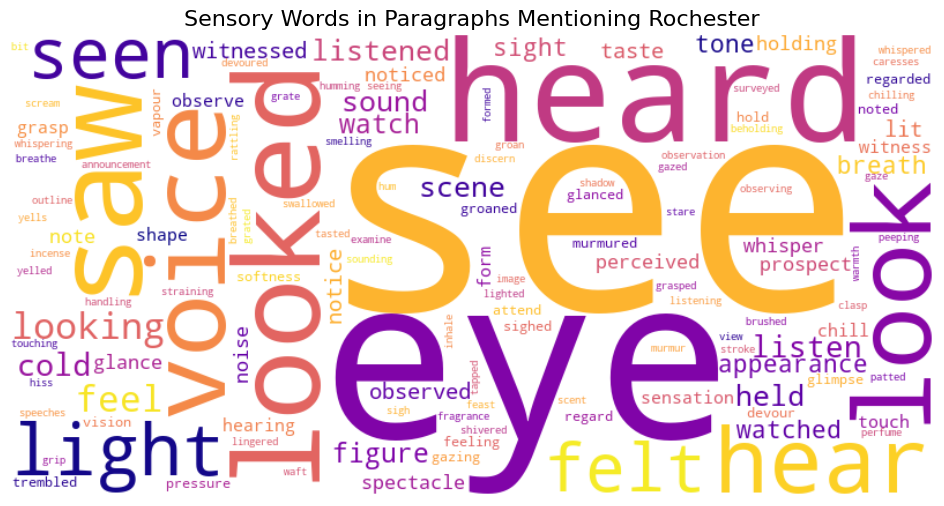

In [127]:
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='plasma'
).generate(text_for_wordcloud)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Sensory Words in Paragraphs Mentioning Rochester", fontsize=16)
plt.show()

We can see here that we have separate references to "looked" and "looking". To unify these, we will work on lemmas rather than words.

In [128]:
def extract_lemmas_from_matches(sense_paragraphs, nlp):
    all_lemmas = []

    for para in sense_paragraphs:
        doc = nlp(para["text"])  # Re-run NLP on cleaned paragraph text
        for _, match_text in para["matches"]:
            # Find the lemma of the matched text
            for token in doc:
                if token.text.lower() == match_text.lower():
                    all_lemmas.append(token.lemma_.lower())
                    break  # Just one match per word
    return all_lemmas


In [129]:
all_lemmas = extract_lemmas_from_matches(rochester_and_sense_paras, nlp)

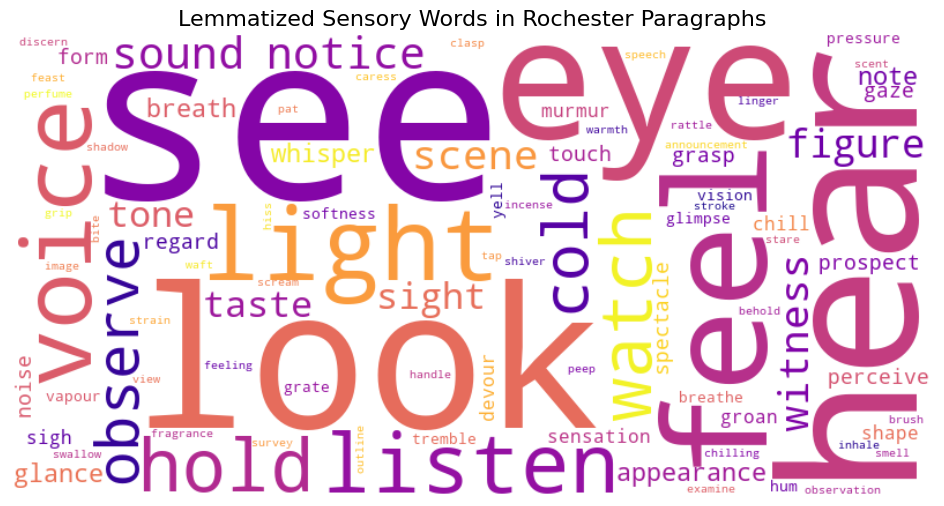

In [182]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

text_for_wordcloud = " ".join(all_lemmas)

wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    colormap='plasma'
).generate(text_for_wordcloud)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Lemmatized Sensory Words in Rochester Paragraphs", fontsize=16)

output_path = 'senses_in_rochester_paragraphs.jpg'
plt.savefig(output_path, format='png')

plt.show()



I am now curious to find out the top lemmas and track their occurrence across the novel. I include an `excluded_lemmas` dictionary which can be filled with strings in case we ever want to exclude the commonest lemmas such as "see", "hear", and "feel". For now I do not use it.

In [131]:
from collections import Counter

excluded_lemmas = {}

# Filter them out before counting
lemma_freqs = Counter(
    lemma for lemma in all_lemmas if lemma not in excluded_lemmas
)

# Top 10 most common lemmas, excluding "say"
top_10_lemmas = [lemma for lemma, _ in lemma_freqs.most_common(10)]

In [133]:
from collections import defaultdict

# Initialize: chapter -> lemma -> count
chapter_lemma_counts = defaultdict(lambda: Counter())

for para in rochester_and_sense_paras:
    chapter = para["chapter"]
    doc = nlp(para["text"])
    matched_lemmas = set()

    for _, match_text in para["matches"]:
        for token in doc:
            if token.text.lower() == match_text.lower():
                lemma = token.lemma_.lower()
                if lemma in top_10_lemmas:
                    matched_lemmas.add(lemma)
                break

    for lemma in matched_lemmas:
        chapter_lemma_counts[chapter][lemma] += 1

Now I can create a data frame from this information. We can see the top sensory lemmas in the novel by looking at the unique lemmas:

In [135]:
# Convert to DataFrame
data = []
for chapter, lemma_counts in chapter_lemma_counts.items():
    for lemma in top_10_lemmas:
        count = lemma_counts.get(lemma, 0)
        data.append({"Chapter": chapter, "Lemma": lemma, "Count": count})

df = pd.DataFrame(data)

In [139]:
df['Lemma'].unique()

array(['see', 'look', 'hear', 'eye', 'feel', 'light', 'voice', 'listen',
       'hold', 'watch'], dtype=object)

We can see the total number for each sensory lemma. This is a count of the total appearances of these lemmas in all paragraphs that both mention Rochester and have sense references, across the whole novel.

In [144]:
df.groupby('Lemma')['Count'].sum().sort_values(ascending=False)

Lemma
see       77
look      57
hear      50
eye       39
feel      28
light     20
voice     19
listen    13
hold      12
watch     12
Name: Count, dtype: int64

We can visualize the data with a bar chart.

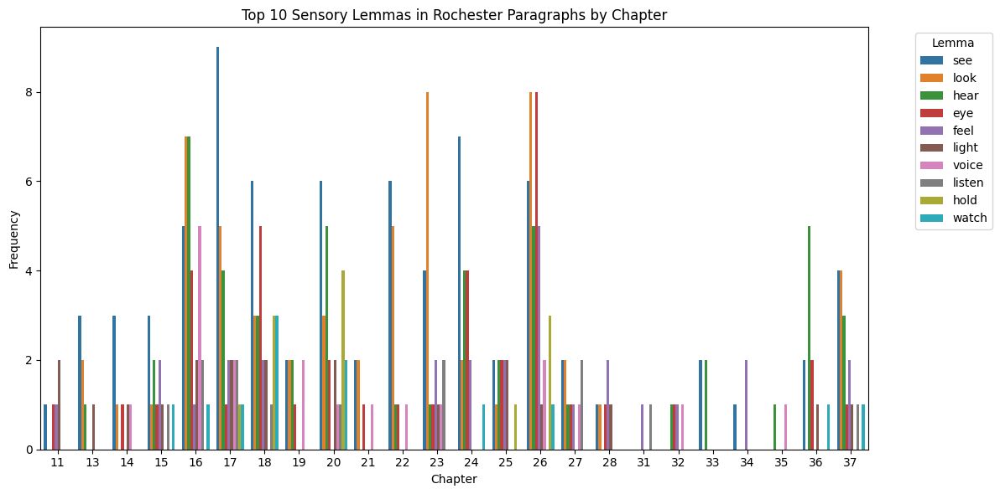

In [145]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(data=df, x="Chapter", y="Count", hue="Lemma")

plt.title("Top 10 Sensory Lemmas in Rochester Paragraphs by Chapter")
plt.xlabel("Chapter")
plt.ylabel("Frequency")
plt.legend(title="Lemma", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Rather than by lemma, we may want to visualize the data by sense referenced.

In [149]:
from collections import defaultdict

# Exclude generic verbs
excluded_lemmas = {"say", "speak", "call"}

# Initialize
sense_lemmas = defaultdict(set)

for para in rochester_and_sense_paras:
    doc = nlp(para["text"])
    for sense, match_text in para["matches"]:
        for token in doc:
            if token.text.lower() == match_text.lower():
                lemma = token.lemma_.lower()
                if lemma not in excluded_lemmas:
                    sense_lemmas[sense.lower()].add(lemma)
                break

In [150]:
# Initialize: chapter -> sense -> count
chapter_sense_counts = defaultdict(lambda: defaultdict(int))

for para in rochester_and_sense_paras:
    chapter = para["chapter"]
    doc = nlp(para["text"])

    for sense, match_text in para["matches"]:
        sense = sense.lower()
        for token in doc:
            if token.text.lower() == match_text.lower():
                lemma = token.lemma_.lower()
                if lemma in sense_lemmas[sense] and lemma not in excluded_lemmas:
                    chapter_sense_counts[chapter][sense] += 1
                break


In [153]:
data = []
for chapter, senses in chapter_sense_counts.items():
    for sense, count in senses.items():
        data.append({"Chapter": chapter, "Sense": sense.capitalize(), "Count": count})

df_senses = pd.DataFrame(data)

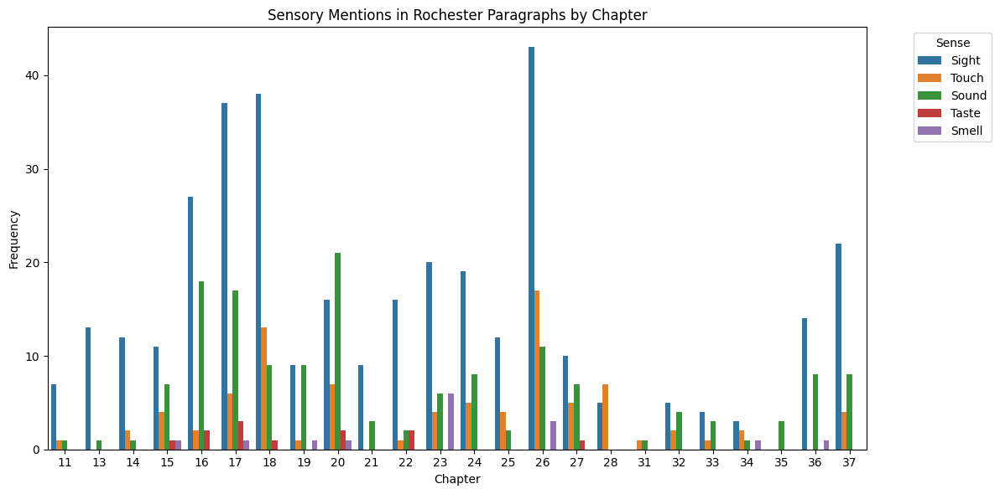

In [154]:
plt.figure(figsize=(12, 6))
sns.barplot(data=df_senses, x="Chapter", y="Count", hue="Sense")

plt.title("Sensory Mentions in Rochester Paragraphs by Chapter")
plt.xlabel("Chapter")
plt.ylabel("Frequency")
plt.legend(title="Sense", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## 5. Exploring food and eating in Jane Eyre

Another direction for studying the senses in Jane Eyre is to look at food in the novel. Jane Eyre's relationship to food has received some critical attention and forms an important theme in the narrative. Here, I explore one possible approach to obtaining references to food scenes using Python natural language processing. To accomplish this, we will have to venture into semantic analysis. This requires the medium or large language models, which contain semantic vectors.

After downloading the medium or large model as described at the start of this notebook, we will redefine our nlp pipeline in reference to the larger model.

In [156]:
nlp = spacy.load("en_core_web_lg")

As usual, we will work with one chapter before extending the process to the whole novel. Here I pick out chapter 5. We will look for tokens that are semantically similar to the word "food". Using the medium or large language models, each token has a `.similarity()` method that can be used to calculate its similarity to other tokens. We will look for tokens that have a similarity rating to "food" that is higher than 0.6

In [170]:
text = chapters_dict[5]

In [171]:
# Get the "food" vector
food_token = nlp("food")[0]

# Load and split Jane Eyre text into paragraphs
paragraphs = [p.strip() for p in text.split("\n\n") if p.strip()]

# Threshold for similarity — you can tune this
SIMILARITY_THRESHOLD = 0.6

matching_results = []

for para in paragraphs:
    doc = nlp(para)
    matched_words = [
        token.text for token in doc
        if token.has_vector and not token.is_stop and food_token.similarity(token) > SIMILARITY_THRESHOLD
    ]
    if matched_words:
        matching_results.append((para, matched_words))

# Output
print(f"\nFound {len(matching_results)} paragraphs referencing food-like concepts:\n")
for para, words in matching_results:
    print("-" * 80)
    print(f"🔍 Matched words: {', '.join(words)}\n")
    print(para)


Found 10 paragraphs referencing food-like concepts:

--------------------------------------------------------------------------------
🔍 Matched words: eat

Five o’clock had hardly struck on the morning of the 19th of January,
when Bessie brought a candle into my closet and found me already up and
nearly dressed. I had risen half-an-hour before her entrance, and had
washed my face, and put on my clothes by the light of a half-moon just
setting, whose rays streamed through the narrow window near my crib. I
was to leave Gateshead that day by a coach which passed the lodge gates
at six A.M. Bessie was the only person yet risen; she had lit a fire in
the nursery, where she now proceeded to make my breakfast. Few children
can eat when excited with the thoughts of a journey; nor could I.
Bessie, having pressed me in vain to take a few spoonfuls of the boiled
milk and bread she had prepared for me, wrapped up some biscuits in a
paper and put them into my bag; then she helped me on with my pel

We can see that this process was effective in finding some basic matches. It does not find references to specific forms of food, but it does find references to food and eating. It is a very basic analysis and could use a great deal of refining but it could provide a useful foundation for studying food and eating in Jane Eyre.

Now we can run it on the whole set of chapters.

In [172]:
results_by_chapter = []

# Get the "food" vector
food_token = nlp("food")[0]
SIMILARITY_THRESHOLD = 0.6

for chapter_num, text in chapters_dict.items():
    chapter_results = []

    # Keep track of character offset as we iterate through paragraphs
    offset = 0
    paragraphs = [p.strip() for p in text.split("\n\n") if p.strip()]

    for para in paragraphs:
        para_start = text.find(para, offset)
        para_end = para_start + len(para)
        offset = para_end  # update offset to avoid duplicate matches on same text

        doc = nlp(para)
        matched_words = [
            token.text for token in doc
            if token.has_vector and not token.is_stop and food_token.similarity(token) > SIMILARITY_THRESHOLD
        ]

        if matched_words:
            chapter_results.append({
                'chapter': chapter_num,
                'paragraph': para,
                'matched_words': matched_words,
                'start_char': para_start,
                'end_char': para_end
            })

    results_by_chapter.append({
        'chapter': chapter_num,
        'matches': chapter_results
    })


In [176]:
# Define the cleaning function
def clean_texts(results):
    for chapter_data in results:
        for match in chapter_data['matches']:
            # Clean the paragraph text by replacing newlines with spaces
            match["paragraph"] = match["paragraph"].replace("\n", " ")

# Clean the results before converting to DataFrame
clean_texts(results_by_chapter)


# Flatten the nested structure
flattened_data = []

for chapter_data in results_by_chapter:
    chapter_num = chapter_data['chapter']
    for match in chapter_data['matches']:
        flattened_data.append({
            'chapter': chapter_num,
            'paragraph': match['paragraph'],
            'matched_words': match['matched_words'],
            'start_char': match['start_char'],
            'end_char': match['end_char']
        })

# Create DataFrame
df_food = pd.DataFrame(flattened_data)

In [177]:
df_food

,chapter,paragraph,matched_words,start_char,end_char
0,1,"“You have no business to take our books; you are a dependent, mama says; you have no money; your father left you none; you ought to beg, and not to live here with gentlemen’s children like us, and eat the same meals we do, and wear clothes at our mama’s expense. Now, I’ll teach you to rummage my bookshelves: for they _are_ mine; all the house belongs to me, or will do in a few years. Go and stand by the door, out of the way of the mirror and the windows.”","[eat, meals]",8678,9137
1,2,"“Unjust!—unjust!” said my reason, forced by the agonising stimulus into precocious though transitory power: and Resolve, equally wrought up, instigated some strange expedient to achieve escape from insupportable oppression—as running away, or, if that could not be effected, never eating or drinking more, and letting myself die.",[eating],8323,8652
2,3,"“Would you like to drink, or could you eat anything?”",[eat],2197,2250
3,3,"Bessie had been down into the kitchen, and she brought up with her a tart on a certain brightly painted china plate, whose bird of paradise, nestling in a wreath of convolvuli and rosebuds, had been wont to stir in me a most enthusiastic sense of admiration; and which plate I had often petitioned to be allowed to take in my hand in order to examine it more closely, but had always hitherto been deemed unworthy of such a privilege. This precious vessel was now placed on my knee, and I was cordially invited to eat the circlet of delicate pastry upon it. Vain favour! coming, like most other favours long deferred and often wished for, too late! I could not eat the tart; and the plumage of the bird, the tints of the flowers, seemed strangely faded: I put both plate and tart away. Bessie asked if I would have a book: the word _book_ acted as a transient stimulus, and I begged her to fetch Gulliver’s Travels from the library. This book I had again and again perused with delight. I considered it a narrative of facts, and discovered in it a vein of interest deeper than what I found in fairy tales: for as to the elves, having sought them in vain among foxglove leaves and bells, under mushrooms and beneath the ground-ivy mantling old wall-nooks, I had at length made up my mind to the sad truth, that they were all gone out of England to some savage country where the woods were wilder and thicker, and the population more scant; whereas, Lilliput and Brobdignag being, in my creed, solid parts of the earth’s surface, I doubted not that I might one day, by taking a long voyage, see with my own eyes the little fields, houses, and trees, the diminutive people, the tiny cows, sheep, and birds of the one realm; and the corn-fields forest-high, the mighty mastiffs, the monster cats, the tower-like men and women, of the other. Yet, when this cherished volume was now placed in my hand—when I turned over its leaves, and sought in its marvellous pictures the charm I had, till now, never failed to find—all was eerie and dreary; the giants were gaunt goblins, the pigmies malevolent and fearful imps, Gulliver a most desolate wanderer in most dread and dangerous regions. I closed the book, which I dared no longer peruse, and put it on the table, beside the untasted tart.","[eat, eat]",4838,7119
4,3,"Bessie would rather have stayed, but she was obliged to go, because punctuality at meals was rigidly enforced at Gateshead Hall.",[meals],10759,10887
...,...,...,...,...,...
71,34,"“And Rosamond Oliver?” suggested Mary, the words seeming to escape her lips involuntarily: for no sooner had she uttered them, than she made a gesture as if wishing to recall them. St. John had a book in his hand—it was his unsocial custom to read at meals—he closed it, and looked up.",[meals],14880,15165
72,35,"But I was forced to meet him again at supper. During that meal he appeared just as composed as usual. I had thought he would hardly speak to me, and I was certain he had given up the pursuit of his matrimonial sche

## 6. Exporting our data sets

We have exported three data sets to csv-formatted text files, but now we want to be systematic and generate shareable csv files from all our major data sets. We need files for:
- each of the five senses by sentence
- all five senses by sentence
- sentences with references to more than one sense
- paragraphs containing references to any of the five senses
- paragraphs containing references to Rochester
- paragraphs containing references both to Rochester and to the senses
- paragraphs containing references to food, meals, and eating

In [178]:
df_sight.to_csv("sight_sentences.csv", index=False)
df_sound.to_csv("sound_sentences.csv", index=False)
df_smell.to_csv("smell_sentences.csv", index=False)
df_taste.to_csv("taste_sentences.csv", index=False)
df_touch.to_csv("touch_sentences.csv", index=False)
all_senses_df.to_csv("all_senses_sentences.csv", index=False)
df_multi_sense.to_csv("multi_sense_sentences.csv", index=False)

df_sense_paras.to_csv("sense_paragraphs.csv", index=False)
df_rochester_paras.to_csv("rochester_paragraphs.csv", index=False)
df_rochester_senses.to_csv("paras_with_senses_and_rochester.csv", index=False)

df_food.to_csv("food_sentences.csv", index=False)

We now have shareable data sets on the senses, eating, and Rochester in Jane Eyre. As we have seen, these can be used to generate data frames, the data frames can be used to analyze the data, and we can also generate visualizations based on the data. 